In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import glob

In [19]:
df=glob.glob(r'C:\Users\yniku\Downloads\stocks/*csv')

In [4]:
len(df)

509

In [22]:
all_data= pd.DataFrame()
for file in df:
    combined_data=pd.read_csv(file)
    all_data = pd.concat([all_data, combined_data], ignore_index=True)

In [21]:
all_data.Name.unique()

array(['AAL', 'AAPL', 'AAP', 'ABBV', 'ABC', 'ABT', 'ACN', 'ADBE', 'ADI',
       'ADM', 'ADP', 'ADSK', 'ADS', 'AEE', 'AEP', 'AES', 'AET', 'AFL',
       'AGN', 'AIG', 'AIV', 'AIZ', 'AJG', 'AKAM', 'ALB', 'ALGN', 'ALK',
       'ALLE', 'ALL', 'ALXN', 'AMAT', 'AMD', 'AME', 'AMGN', 'AMG', 'AMP',
       'AMT', 'AMZN', 'ANDV', 'ANSS', 'ANTM', 'AON', 'AOS', 'APA', 'APC',
       'APD', 'APH', 'APTV', 'ARE', 'ARNC', 'ATVI', 'AVB', 'AVGO', 'AVY',
       'AWK', 'AXP', 'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY',
       'BDX', 'BEN', 'BF.B', 'BHF', 'BHGE', 'BIIB', 'BK', 'BLK', 'BLL',
       'BMY', 'BRK.B', 'BSX', 'BWA', 'BXP', 'CAG', 'CAH', 'CAT', 'CA',
       'CBG', 'CBOE', 'CBS', 'CB', 'CCI', 'CCL', 'CDNS', 'CELG', 'CERN',
       'CFG', 'CF', 'CHD', 'CHK', 'CHRW', 'CHTR', 'CINF', 'CI', 'CLX',
       'CL', 'CMA', 'CMCSA', 'CME', 'CMG', 'CMI', 'CMS', 'CNC', 'CNP',
       'COF', 'COG', 'COL', 'COO', 'COP', 'COST', 'COTY', 'CPB', 'CRM',
       'CSCO', 'CSRA', 'CSX', 'CTAS', 'CTL', 'CTSH', 'CTXS

(-0.5, 399.5, 199.5, -0.5)

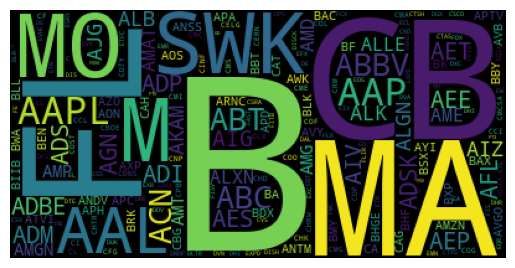

In [154]:
wc= ' '.join(all_data['Name'].unique())
from wordcloud import STOPWORDS, WordCloud
x=WordCloud(stopwords=set(STOPWORDS)).generate(wc)
plt.imshow(x)
plt.axis('off')

In [23]:
all_data.shape

(624076, 7)

In [24]:
all_data.isnull().sum()

date       0
open      11
high       8
low        8
close      0
volume     0
Name       0
dtype: int64

In [25]:
all_data.dropna(inplace=True)

In [26]:
all_data.isnull().sum()

date      0
open      0
high      0
low       0
close     0
volume    0
Name      0
dtype: int64

In [27]:
all_data.dtypes

date       object
open      float64
high      float64
low       float64
close     float64
volume      int64
Name       object
dtype: object

In [28]:
all_data['date']=pd.to_datetime(all_data['date'])

In [29]:
all_data.dtypes

date      datetime64[ns]
open             float64
high             float64
low              float64
close            float64
volume             int64
Name              object
dtype: object

In [30]:
company_list=all_data.Name.unique()

In [31]:
company_list

array(['AAL', 'AAPL', 'AAP', 'ABBV', 'ABC', 'ABT', 'ACN', 'ADBE', 'ADI',
       'ADM', 'ADP', 'ADSK', 'ADS', 'AEE', 'AEP', 'AES', 'AET', 'AFL',
       'AGN', 'AIG', 'AIV', 'AIZ', 'AJG', 'AKAM', 'ALB', 'ALGN', 'ALK',
       'ALLE', 'ALL', 'ALXN', 'AMAT', 'AMD', 'AME', 'AMGN', 'AMG', 'AMP',
       'AMT', 'AMZN', 'ANDV', 'ANSS', 'ANTM', 'AON', 'AOS', 'APA', 'APC',
       'APD', 'APH', 'APTV', 'ARE', 'ARNC', 'ATVI', 'AVB', 'AVGO', 'AVY',
       'AWK', 'AXP', 'AYI', 'AZO', 'A', 'BAC', 'BAX', 'BA', 'BBT', 'BBY',
       'BDX', 'BEN', 'BF.B', 'BHF', 'BHGE', 'BIIB', 'BK', 'BLK', 'BLL',
       'BMY', 'BRK.B', 'BSX', 'BWA', 'BXP', 'CAG', 'CAH', 'CAT', 'CA',
       'CBG', 'CBOE', 'CBS', 'CB', 'CCI', 'CCL', 'CDNS', 'CELG', 'CERN',
       'CFG', 'CF', 'CHD', 'CHK', 'CHRW', 'CHTR', 'CINF', 'CI', 'CLX',
       'CL', 'CMA', 'CMCSA', 'CME', 'CMG', 'CMI', 'CMS', 'CNC', 'CNP',
       'COF', 'COG', 'COL', 'COO', 'COP', 'COST', 'COTY', 'CPB', 'CRM',
       'CSCO', 'CSRA', 'CSX', 'CTAS', 'CTL', 'CTSH', 'CTXS

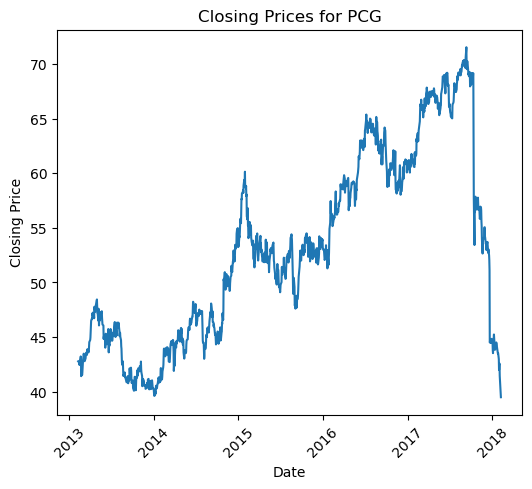

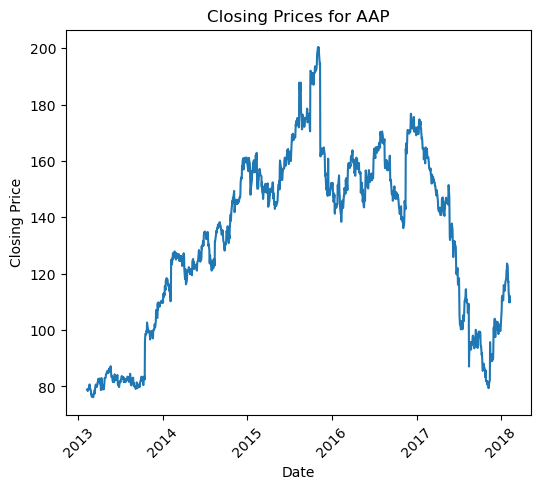

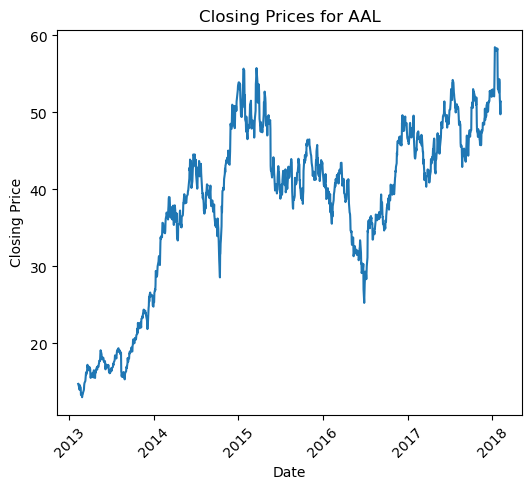

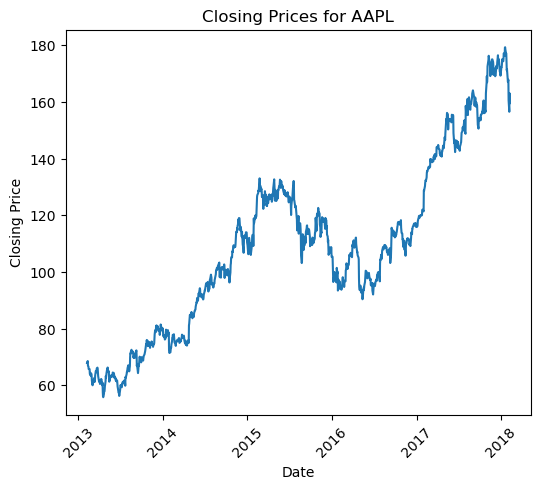

In [32]:
def plot_company_data(company_name):
    """
    Plots the closing prices over time for a given company.

    Parameters:
    company_name (str): The name of the company to plot.
    """
    filter1 = all_data['Name'] == company_name
    df1 = all_data[filter1]

    if df1.empty:
        print(f"No data available for company: {company_name}")
        return

    plt.figure(figsize=(6, 5))
    plt.plot(df1['date'], df1['close'])
    plt.title(f"Closing Prices for {company_name}")
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.xticks(rotation=45)
    plt.show()

# Example usage: plot data for a specific company
company_names = ['PCG', 'AAP', 'AAL', 'AAPL']# Replace with the desired company name
for company_name in company_names:
    plot_company_data(company_name)

In [33]:
all_data.head(10)

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL
5,2013-02-15,13.93,14.61,13.93,14.50,15628000,AAL
6,2013-02-19,14.33,14.56,14.08,14.26,11354400,AAL
7,2013-02-20,14.17,14.26,13.15,13.33,14725200,AAL
8,2013-02-21,13.62,13.95,12.90,13.37,11922100,AAL
9,2013-02-22,13.57,13.60,13.21,13.57,6071400,AAL


In [34]:
all_data['close'].rolling(window=10).mean().head(20)

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9     14.116
10    13.943
11    13.823
12    13.737
13    13.614
14    13.576
15    13.516
16    13.495
17    13.619
18    13.764
19    13.899
Name: close, dtype: float64

In [35]:
new_data= all_data.copy()

In [36]:
new_data

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL
...,...,...,...,...,...,...,...
624071,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
624072,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
624073,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
624074,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS


In [37]:
ma_data=[10,20,50,100,200]
for ma in ma_data:
    new_data['close_'+str(ma)]=new_data['close'].rolling(window=ma).mean()

In [37]:
new_data.sample(14)

,date,open,high,low,close,volume,Name,close_10,close_20,close_50,close_100,close_200
291574,2017-05-30,151.95,152.6700,151.5900,151.7300,3666032,IBM,152.19700,153.136000,162.81160,169.352600,164.227250
272104,2015-10-16,61.74,62.3200,60.2100,61.0300,2156887,HES,60.21900,55.353500,55.59480,59.930300,65.948400
360320,2014-06-13,61.50,61.6400,61.0000,61.3800,1340796,MAR,62.00300,60.692500,58.56800,55.523810,50.378735
204218,2017-02-03,222.84,225.5700,218.4100,223.0800,778858,ESS,225.31400,227.185000,224.09180,220.178800,222.548850
28586,2016-08-18,48.66,48.7300,48.4000,48.5200,1480310,AJG,49.23400,49.250500,48.22940,47.222500,44.155400
590327,2013-10-18,49.68,50.2475,49.2375,50.1125,14387264,V,47.82775,47.951625,46.28445,46.203375,45.229838
342899,2015-04-08,25.64,26.0000,25.5150,25.9500,1156849,LKQ,25.15350,24.768500,25.60350,26.776650,26.874025
517969,2016-10-20,75.40,75.4000,74.1200,74.6800,1012210,SRCL,75.18700,77.183000,80.97160,90.696800,102.208600
600349,2016-07-05,20.34,20.5400,19.6800,20.0900,10259923,WMB,20.92800,21.654500,21.04120,18.828700,24.910200
7622,2013-05-17,80.70,82.2400,80.5000,82.2400,2567982,ACN,80.25200,79.544500,77.62620,71.462500,62.390100


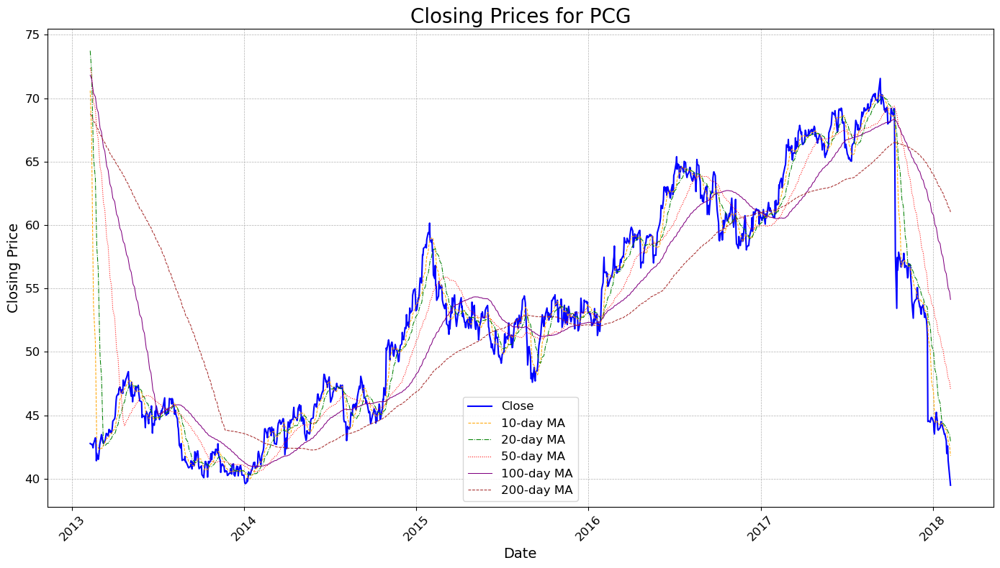

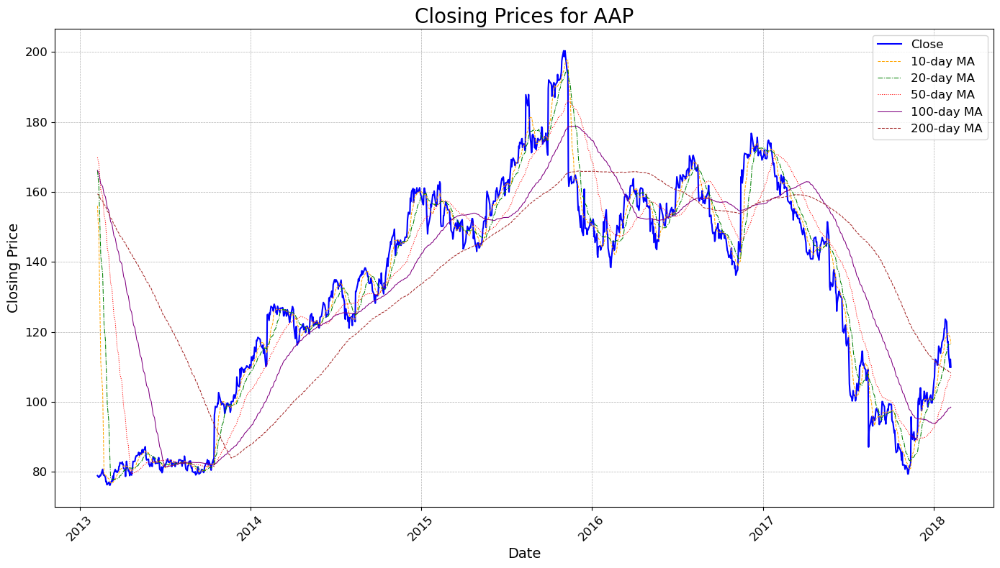

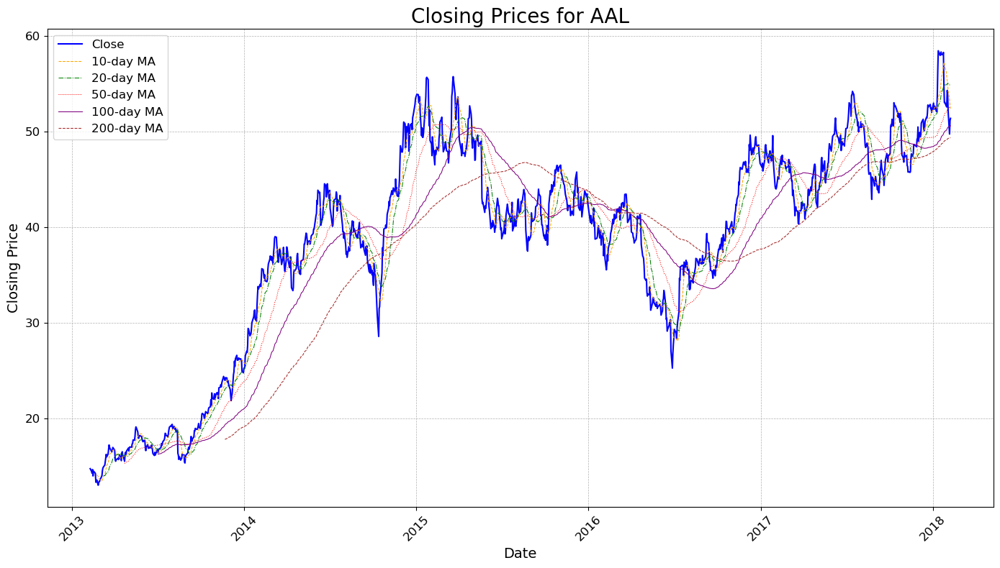

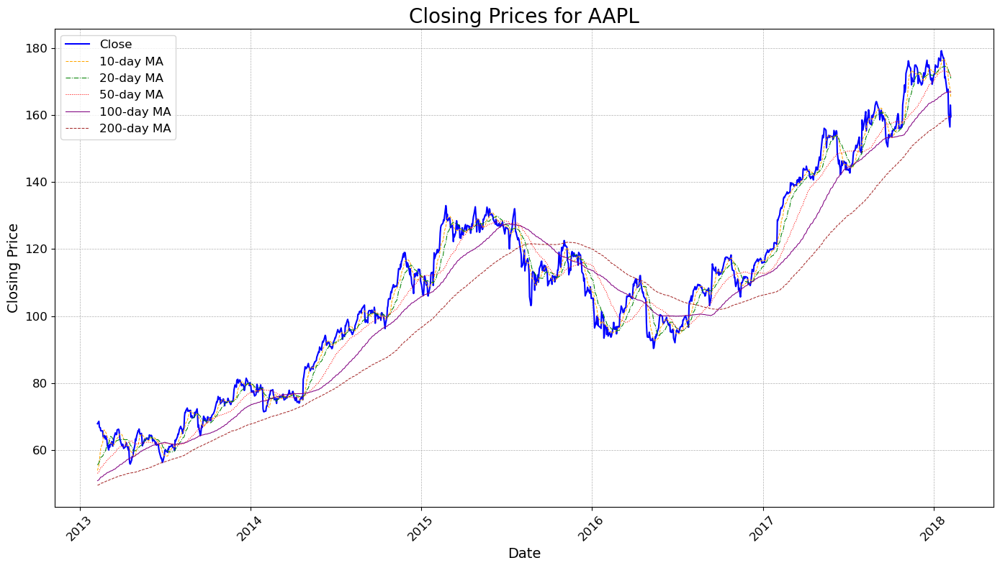

In [39]:
def plot_company_data(new_data, company_name):
    """
    Plots the closing prices over time for a given company.

    Parameters:
    new_data (pd.DataFrame): The dataset containing the company data.
    company_name (str): The name of the company to plot.
    """
    filter1 = new_data['Name'] == company_name
    df1 = new_data[filter1]

    if df1.empty:
        print(f"No data available for company: {company_name}")
        return

    plt.figure(figsize=(14, 8))
    plt.plot(df1['date'], df1['close'], label='Close', color='blue', linestyle='-', linewidth=1.5)
    plt.plot(df1['date'], df1['close_10'], label='10-day MA', color='orange', linestyle='--', linewidth=.75)
    plt.plot(df1['date'], df1['close_20'], label='20-day MA', color='green',linestyle='-.', linewidth=.75)
    plt.plot(df1['date'], df1['close_50'], label='50-day MA', color='red',  linestyle=':', linewidth=.75)
    plt.plot(df1['date'], df1['close_100'], label='100-day MA', color='purple',  linestyle='-', linewidth=.75)
    plt.plot(df1['date'], df1['close_200'], label='200-day MA', color='brown', linestyle='--', linewidth=.75)
    
    plt.title(f"Closing Prices for {company_name}", fontsize=20)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Closing Price', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Example usage: plot data for specific companies
company_names = ['PCG', 'AAP', 'AAL','AAPL']  # Replace with desired company names
for company_name in company_names:
    plot_company_data(new_data, company_name)


In [40]:
new_data['Daily returs in(%)']= new_data['close'].pct_change()*100

In [41]:
new_data

,date,open,high,low,close,volume,Name,close_10,close_20,close_50,close_100,close_200,Daily returs in(%)
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL,NaN,NaN,NaN,NaN,NaN,-1.966102
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL,NaN,NaN,NaN,NaN,NaN,-1.313970
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL,NaN,NaN,NaN,NaN,NaN,2.733006
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL,NaN,NaN,NaN,NaN,NaN,-4.570259
...,...,...,...,...,...,...,...,...,...,...,...,...,...
624071,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS,78.144,76.4605,73.6994,69.6659,65.41860,1.420566
624072,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS,78.160,76.6730,73.8160,69.7809,65.53325,-1.336417
624073,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS,77.795,76.6965,73.8654,69.8652,65.63095,-3.842146
624074,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS,77.363,76.6480,73.9094,69.9451,65.72635,-0.758499


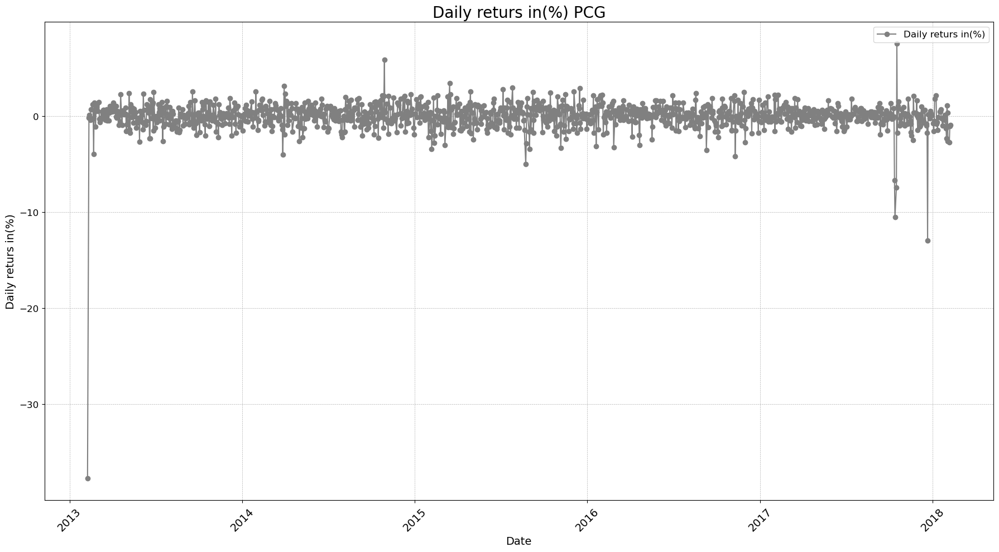

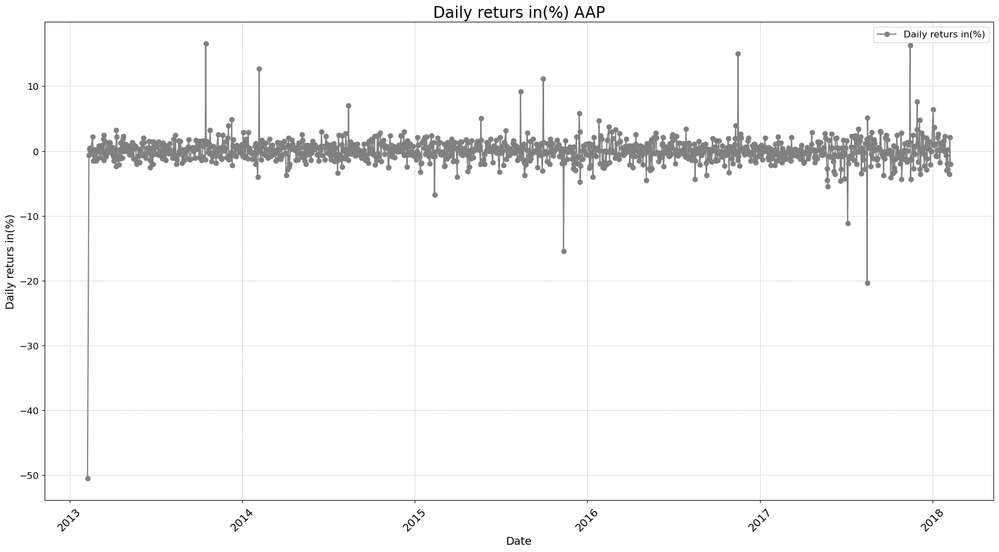

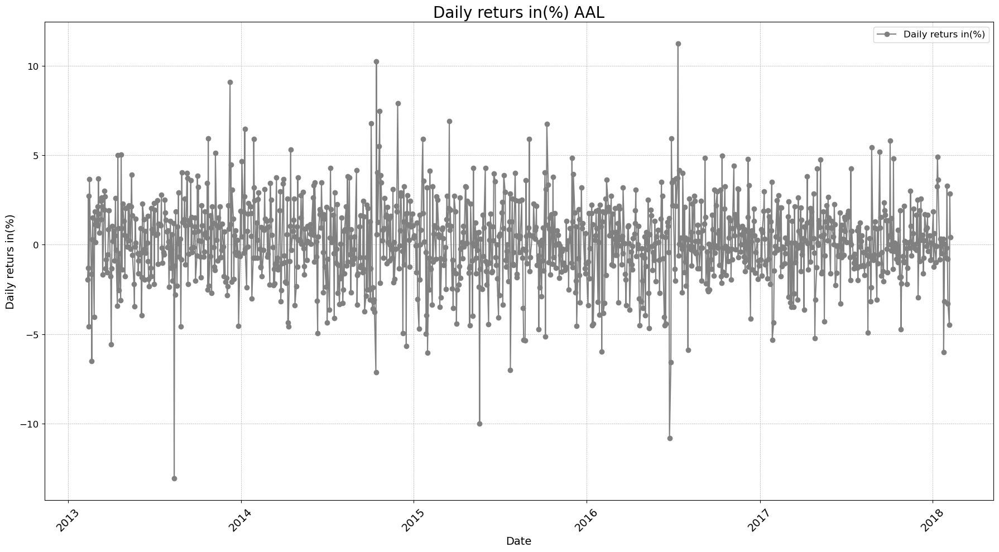

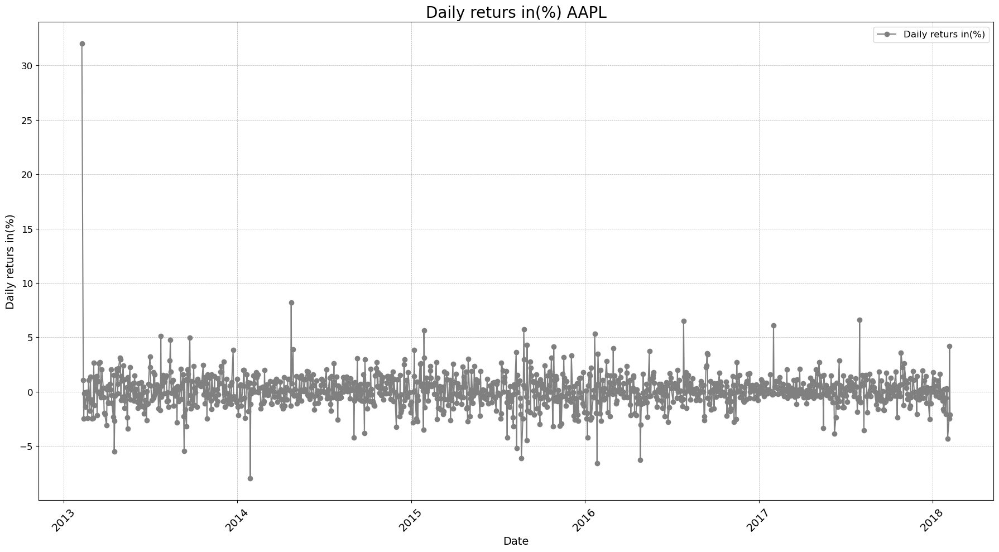

In [42]:
def plot_company_data(new_data, company_name):
    """
    Plots the closing prices over time for a given company.

    Parameters:
    new_data (pd.DataFrame): The dataset containing the company data.
    company_name (str): The name of the company to plot.
    """
    filter1 = new_data['Name'] == company_name
    df1 = new_data[filter1]

    if df1.empty:
        print(f"No data available for company: {company_name}")
        return

    plt.figure(figsize=(18, 10))
    plt.plot(df1['date'], df1['Daily returs in(%)'], label='Daily returs in(%)',marker='o', linestyle='-', color='grey')
    
    plt.title(f"Daily returs in(%) {company_name}", fontsize=20)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Daily returs in(%)', fontsize=14)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Example usage: plot data for specific companies
company_names = ['PCG', 'AAP', 'AAL','AAPL']  # Replace with desired company names
for company_name in company_names:
    plot_company_data(new_data, company_name)


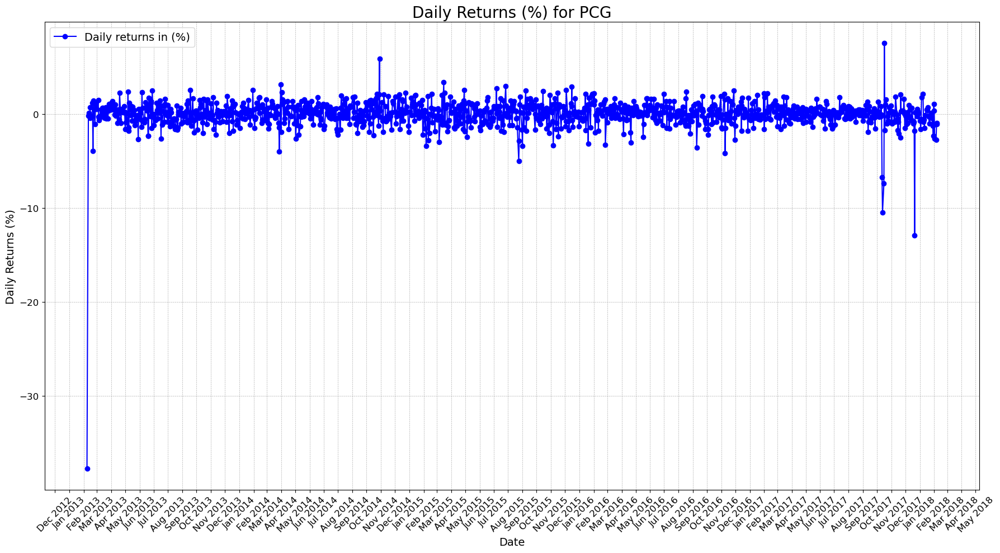

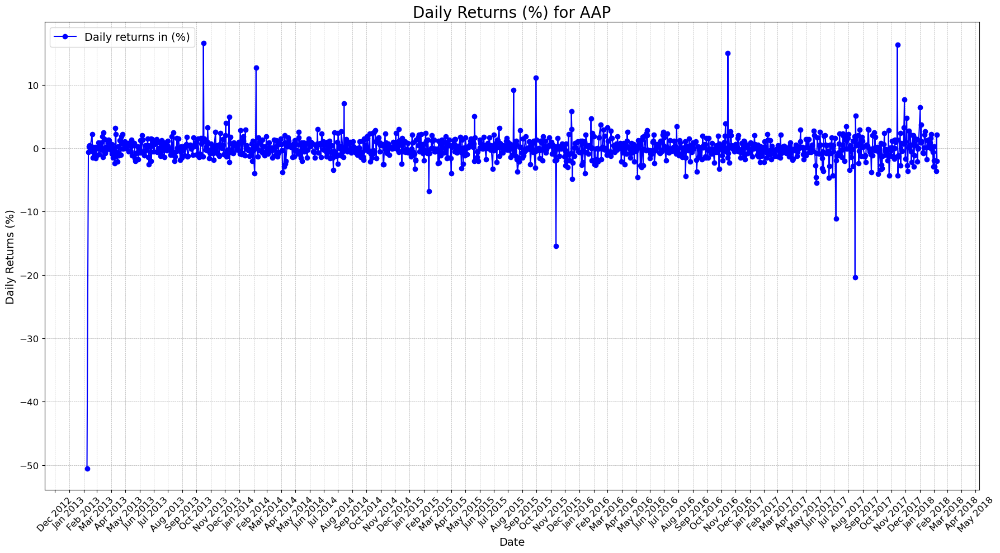

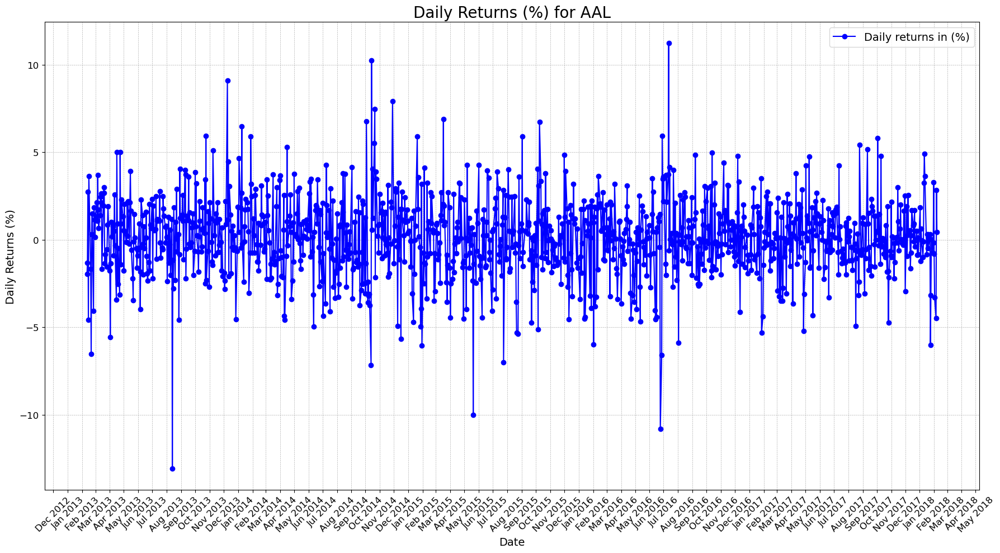

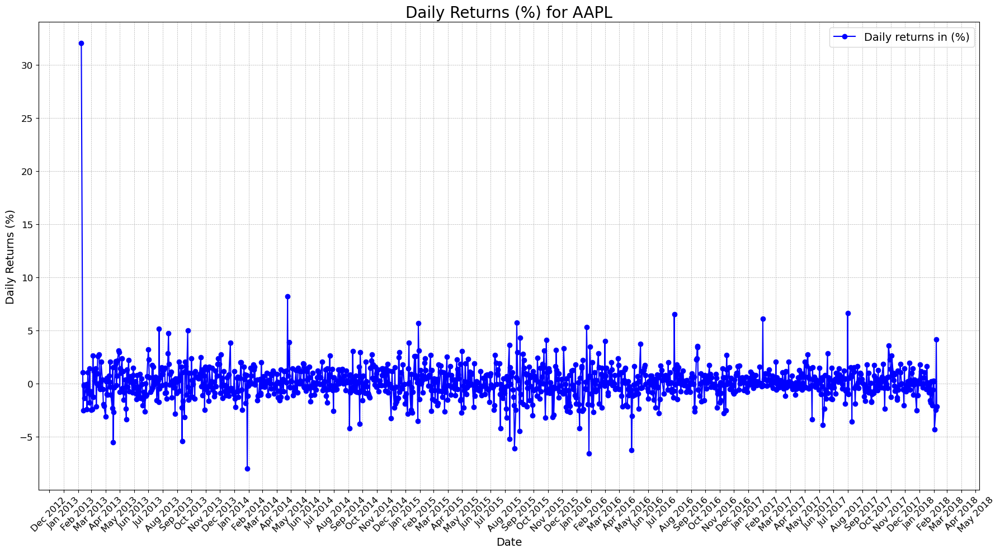

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def plot_company_data(new_data, company_name):
    """
    Plots the daily returns over time for a given company.

    Parameters:
    new_data (pd.DataFrame): The dataset containing the company data.
    company_name (str): The name of the company to plot.
    """
    filter1 = new_data['Name'] == company_name
    df1 = new_data[filter1]

    if df1.empty:
        print(f"No data available for company: {company_name}")
        return

    plt.figure(figsize=(18, 10))
    plt.plot(df1['date'], df1['Daily returs in(%)'], label='Daily returns in (%)', color='blue', marker='o', linestyle='-')
    
    plt.title(f"Daily Returns (%) for {company_name}", fontsize=20)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Daily Returns (%)', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=14)
    plt.grid(True, linestyle='--', linewidth=0.5)
    
    # Format date labels to show month and year
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    
    plt.tight_layout()
    plt.show()

# Example usage: plot data for specific companies
company_names = ['PCG', 'AAP', 'AAL', 'AAPL']  # Replace with desired company names
for company_name in company_names:
    plot_company_data(new_data, company_name)


In [122]:
new_data['date'] = pd.to_datetime(new_data['date'])

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


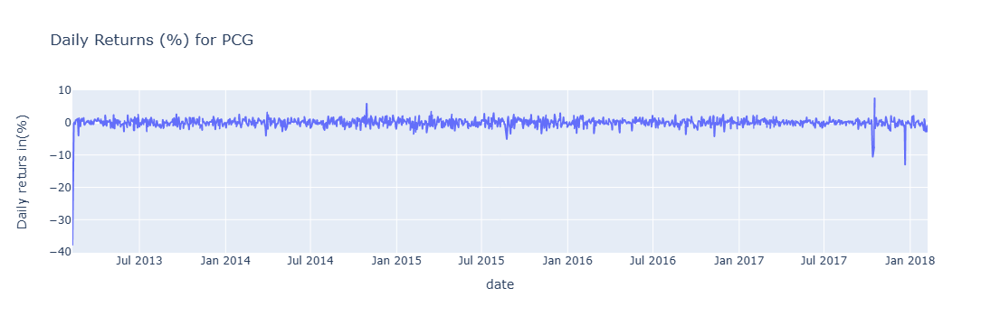

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



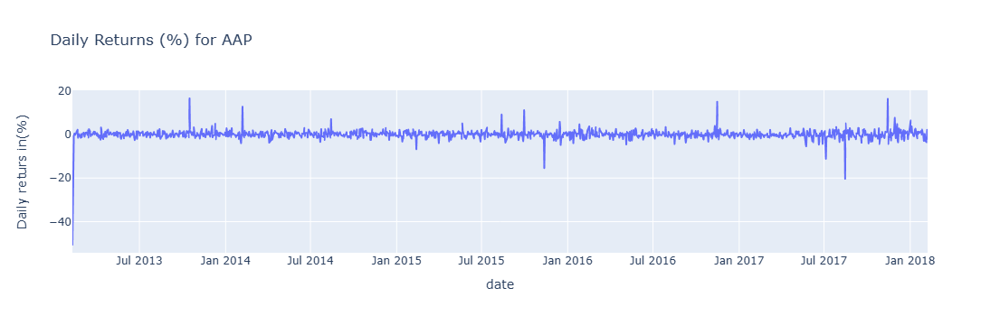

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



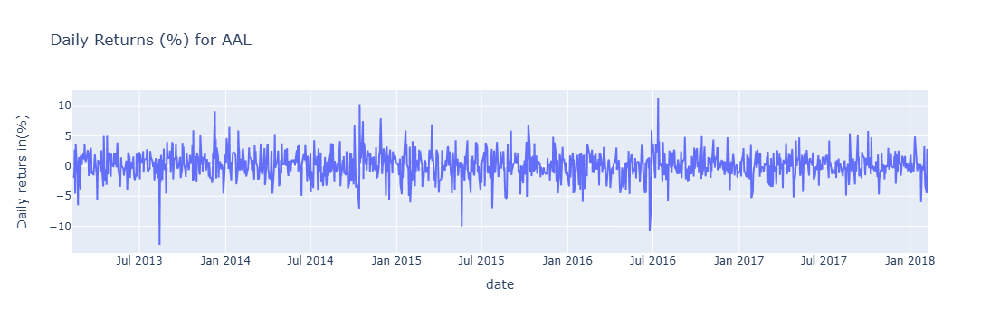

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



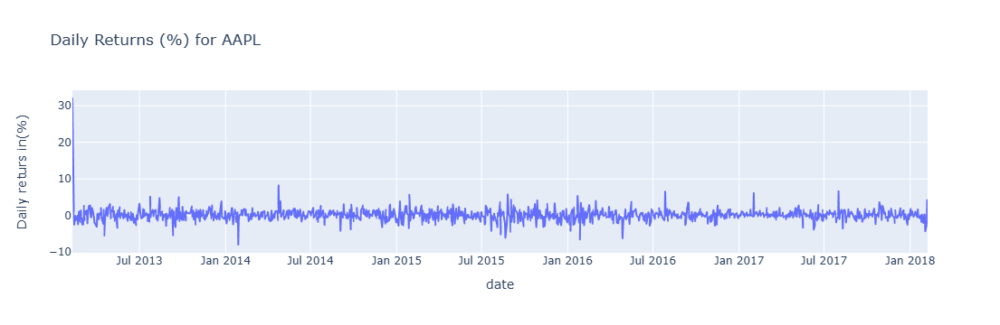

<Figure size 1800x1000 with 0 Axes>

<Figure size 1800x1000 with 0 Axes>

<Figure size 1800x1000 with 0 Axes>

<Figure size 1800x1000 with 0 Axes>

In [43]:
import plotly.express as px

def plot_company_data(new_data, company_name):
    """
    Plots the daily returns over time for a given company.

    Parameters:
    new_data (pd.DataFrame): The dataset containing the company data.
    company_name (str): The name of the company to plot.
    """
    filter1 = new_data['Name'] == company_name
    df1 = new_data[filter1]

    if df1.empty:
        print(f"No data available for company: {company_name}")
        return
        
    plt.figure(figsize=(18, 10))
    x=px.line(df1, x='date', y= 'Daily returs in(%)',title= f"Daily Returns (%) for {company_name}")
    x.show()
    
# Example usage: plot data for specific companies
company_names = ['PCG', 'AAP', 'AAL', 'AAPL']  # Replace with desired company names
for company_name in company_names:
    plot_company_data(new_data, company_name)

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



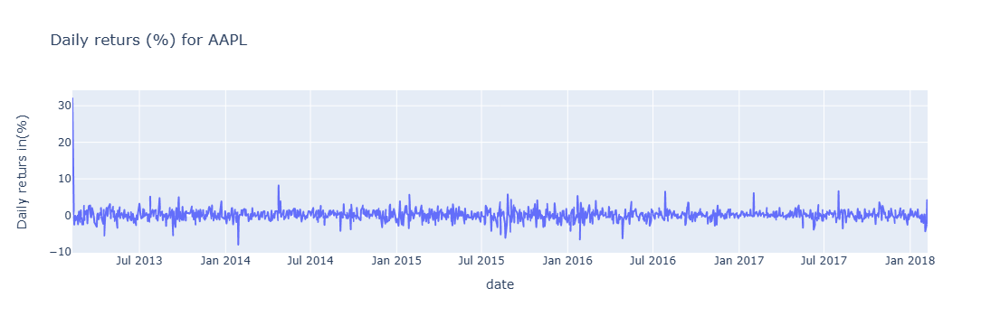

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



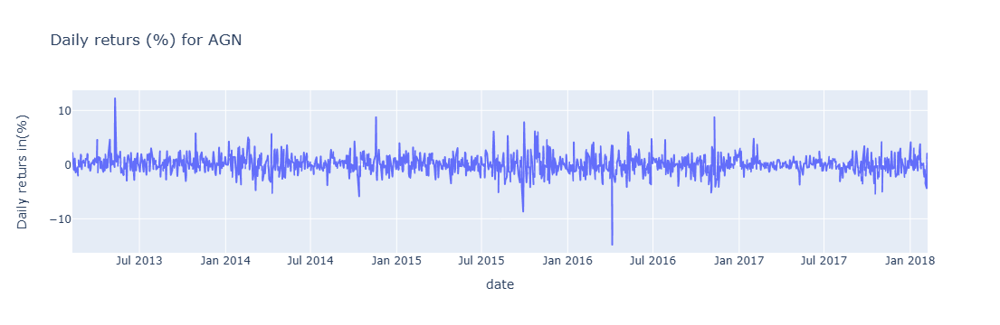

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



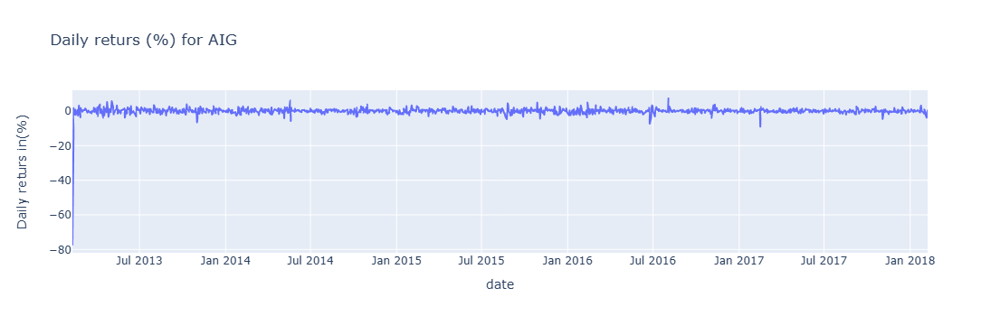

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



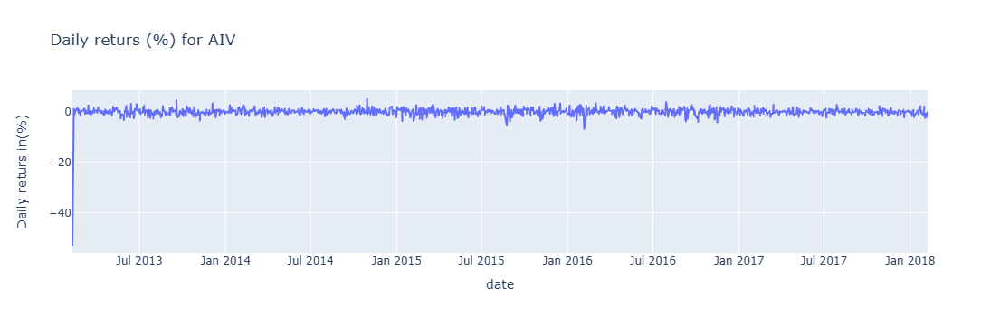

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



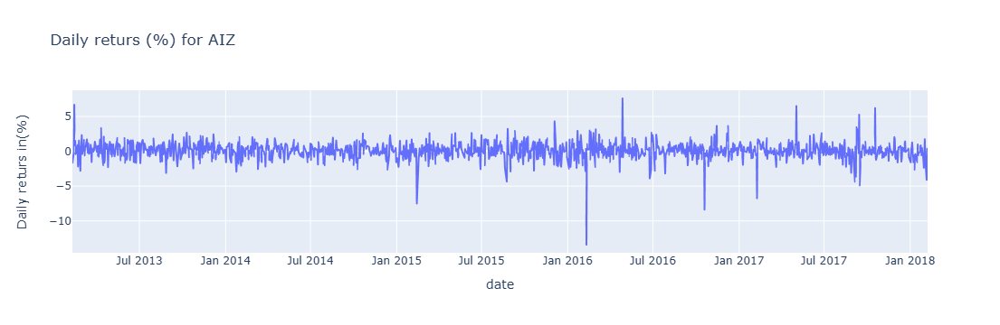

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



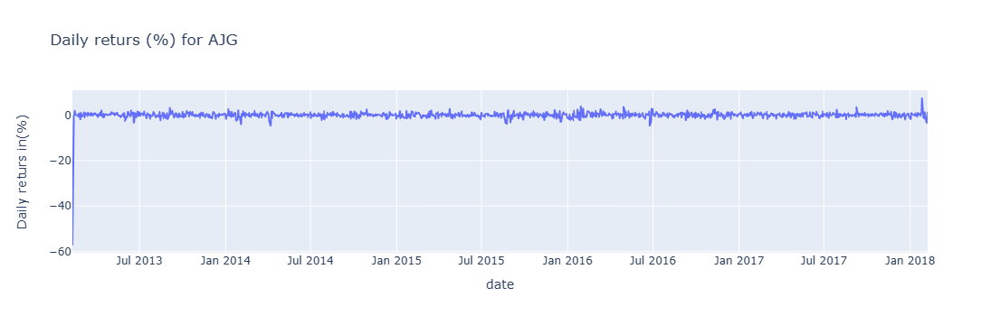

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



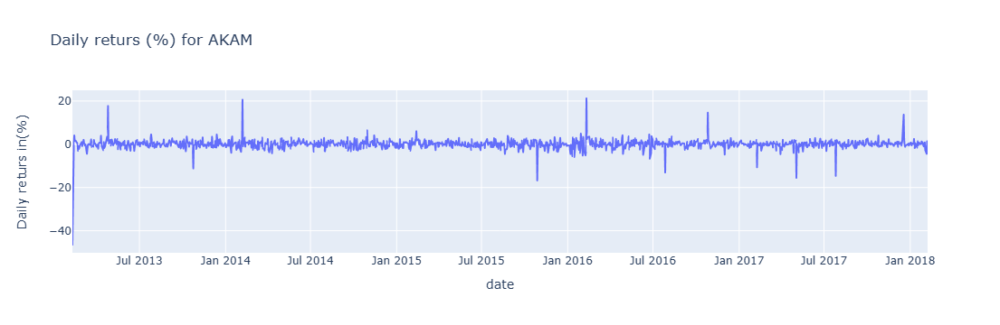

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



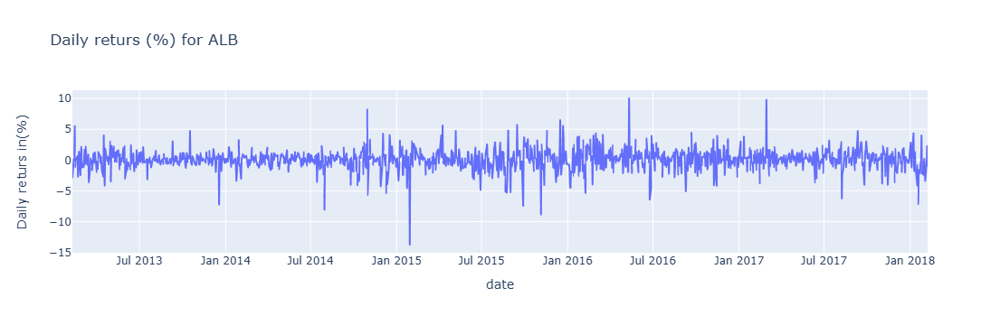

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



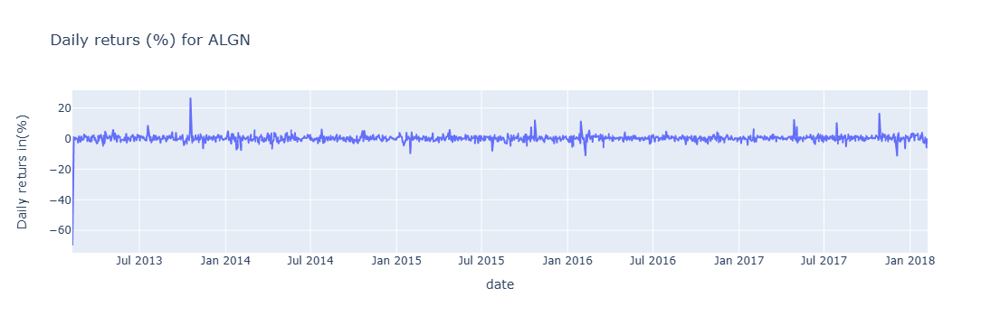

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



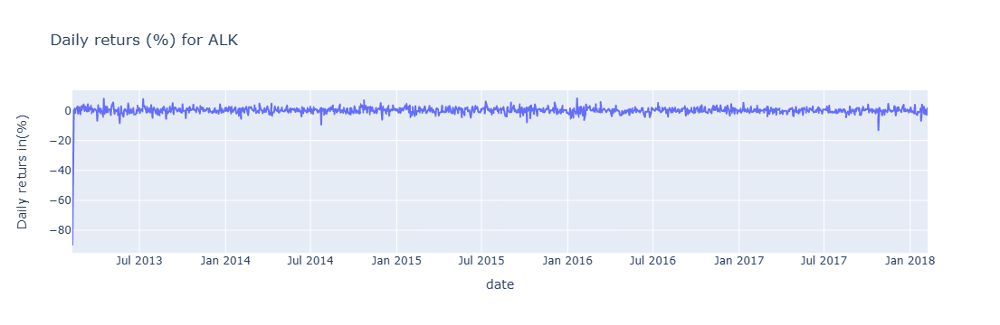

In [173]:
import plotly.express as px
def plot_company_data(new_data, company_name):
    filter = new_data['Name']==company_name
    df1=new_data[filter]
    if df1.empty:
        print(f'There is no such company named {company_name} in the list')
        return
    x= px.line(df1, x= 'date', y ='Daily returs in(%)', title=f'Daily returs (%) for {company_name}')
    x.show()
company_names=['AAPL','AGN', 'AIG', 'AIV', 'AIZ', 'AJG', 'AKAM', 'ALB', 'ALGN', 'ALK']
for company_name in company_names:
    plot_company_data(new_data,company_name)

In [44]:
new_data.dtypes

date                  datetime64[ns]
open                         float64
high                         float64
low                          float64
close                        float64
volume                         int64
Name                          object
close_10                     float64
close_20                     float64
close_50                     float64
close_100                    float64
close_200                    float64
Daily returs in(%)           float64
dtype: object

In [46]:
n_data= new_data.copy()

In [47]:
n_data.dtypes

date                  datetime64[ns]
open                         float64
high                         float64
low                          float64
close                        float64
volume                         int64
Name                          object
close_10                     float64
close_20                     float64
close_50                     float64
close_100                    float64
close_200                    float64
Daily returs in(%)           float64
dtype: object

In [48]:
n_data.set_index('date', inplace=True)

In [49]:
n_data

,open,high,low,close,volume,Name,close_10,close_20,close_50,close_100,close_200,Daily returs in(%)
date,,,,,,,,,,,,
2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL,NaN,NaN,NaN,NaN,NaN,-1.966102
2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL,NaN,NaN,NaN,NaN,NaN,-1.313970
2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL,NaN,NaN,NaN,NaN,NaN,2.733006
2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL,NaN,NaN,NaN,NaN,NaN,-4.570259
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS,78.144,76.4605,73.6994,69.6659,65.41860,1.420566
2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS,78.160,76.6730,73.8160,69.7809,65.53325,-1.336417
2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS,77.795,76.6965,73.8654,69.8652,65.63095,-3.842146


In [65]:
if 'AAPL' in n_data['Name'].values:
    x=n_data[n_data['Name']=='AAPL']
    m_data=x['close'].resample('M').mean()

In [69]:
m_data

date
2013-02-28     65.306264
2013-03-31     63.120110
2013-04-30     59.966432
2013-05-31     63.778927
2013-06-30     60.791120
                 ...    
2017-10-31    157.817273
2017-11-30    172.406190
2017-12-31    171.891500
2018-01-31    174.005238
2018-02-28    161.468000
Freq: M, Name: close, Length: 61, dtype: float64

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



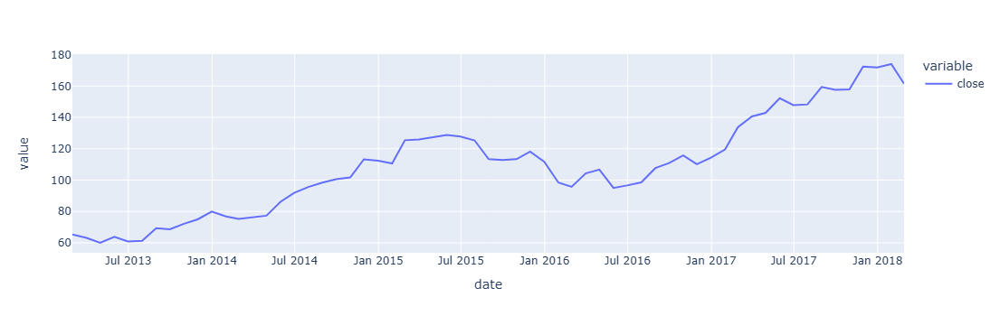

In [68]:
px.line(x['close'].resample('M').mean())

In [58]:
if 'AAPL' in n_data['Name'].values:
    x = n_data[n_data['Name'] == 'AAPL']
    y_data = x['close'].resample('Y').mean()

In [59]:
y_data

date
2013-12-31     67.237839
2014-12-31     92.264531
2015-12-31    120.039861
2016-12-31    104.604008
2017-12-31    150.585080
2018-12-31    171.594231
Freq: A-DEC, Name: close, dtype: float64

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



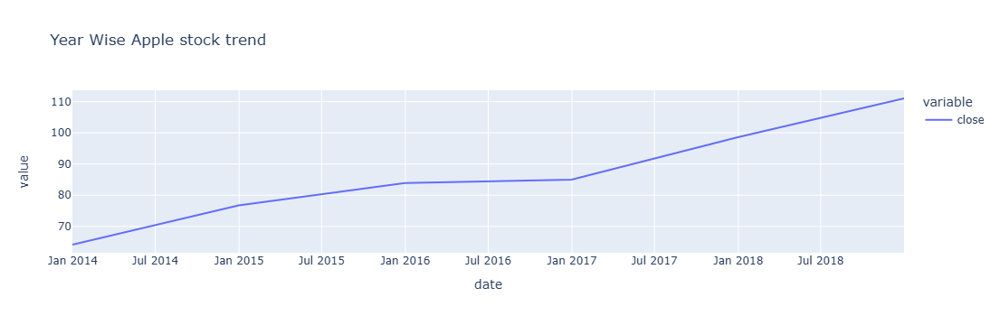

In [61]:
px.line(n_data['close'].resample('Y').mean(), title='Year Wise Apple stock trend')

In [62]:
if 'AAPL' in n_data['Name'].values:
    x = n_data[n_data['Name'] == 'AAPL']
    q_data = x['close'].resample('Q').mean()

In [63]:
q_data

date
2013-03-31     64.020291
2013-06-30     61.534692
2013-09-30     66.320670
2013-12-31     75.567478
2014-03-31     76.086293
2014-06-30     85.117475
2014-09-30     98.163311
2014-12-31    108.821016
2015-03-31    120.776721
2015-06-30    127.937937
2015-09-30    117.303438
2015-12-31    114.299297
2016-03-31     99.655082
2016-06-30     99.401250
2016-09-30    105.866094
2016-12-31    113.399048
2017-03-31    131.712500
2017-06-30    147.875397
2017-09-30    155.304603
2017-12-31    167.148254
2018-03-31    171.594231
Freq: Q-DEC, Name: close, dtype: float64

C:\Users\yniku\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



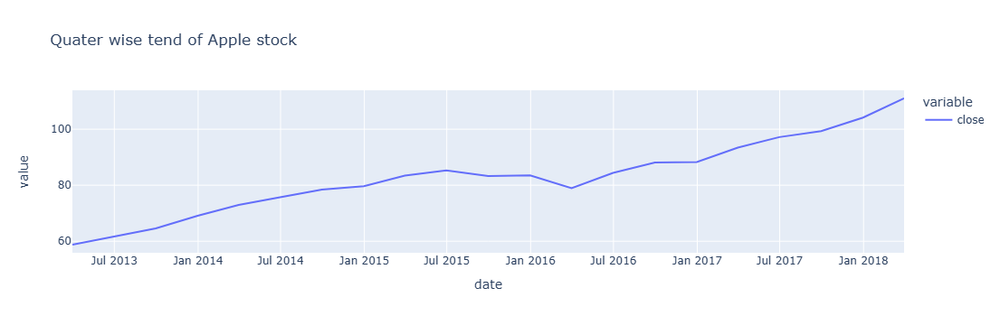

In [64]:
px.line(n_data['close'].resample('Q').mean(), title='Quater wise tend of Apple stock')

In [80]:
if 'AAPL' in new_data['Name'].values:
    aapl = new_data[new_data['Name']=='AAPL']

In [81]:
aapl

,date,open,high,low,close,volume,Name,close_10,close_20,close_50,close_100,close_200,Daily returs in(%)
1259,2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,53.88342,55.52471,53.022084,50.836842,49.483071,32.012062
1260,2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,55.43256,56.13178,53.408912,51.069356,49.593878,1.042235
1261,2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,56.84884,56.55042,53.760768,51.293984,49.708192,-2.506658
1262,2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,58.26140,56.98720,54.085280,51.506940,49.828670,-0.190297
1263,2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,59.49496,57.41198,54.438392,51.710596,49.951548,-0.089934
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2513,2018-02-01,167.1650,168.6200,166.7600,167.7800,47230787,AAPL,171.94800,173.87000,172.825200,166.964700,159.412000,0.209043
2514,2018-02-02,166.0000,166.8000,160.1000,160.5000,86593825,AAPL,170.15200,173.24350,172.635600,166.954700,159.511100,-4.339015
2515,2018-02-05,159.1000,163.8800,156.0000,156.4900,72738522,AAPL,168.10100,172.31800,172.302600,166.911000,159.581350,-2.498442
2516,2018-02-06,154.8300,163.7200,154.0000,163.0300,68243838,AAPL,166.70000,171.75200,172.064000,166.944800,159.685150,4.179181


In [121]:
company_list=['C:\\Users\\yniku\\Downloads\\stocks\\AAPL_data.csv',
              'C:\\Users\\yniku\\Downloads\\stocks\\AMZN_data.csv',
              'C:\\Users\\yniku\\Downloads\\stocks\\MNST_data.csv',
              'C:\\Users\\yniku\\Downloads\\stocks\\GOOGL_data.csv']

In [122]:
aapl=pd.read_csv(company_list[0])
amzn=pd.read_csv(company_list[1])
msft=pd.read_csv(company_list[2])
google=pd.read_csv(company_list[3])

In [129]:
closing_price=pd.DataFrame()

In [130]:
closing_price['apple_closing']=aapl['close']
closing_price['amazon_closing']=amzn['close']
closing_price['google_closing']=google['close']
closing_price['microsft_closing']=msft['close']

In [131]:
closing_price

,apple_closing,amazon_closing,google_closing,microsft_closing
0,67.8542,261.95,393.0777,15.6133
1,68.5614,257.21,391.6012,15.8167
2,66.8428,258.70,390.7403,15.5867
3,66.7156,269.47,391.8214,15.8967
4,66.6556,269.24,394.3039,15.8967
...,...,...,...,...
1254,167.7800,1390.00,1181.5900,67.9300
1255,160.5000,1429.95,1119.2000,66.6300
1256,156.4900,1390.00,1062.3900,63.8500
1257,163.0300,1442.84,1084.4300,64.2100


C:\Users\yniku\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yniku\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yniku\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yniku\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Figure size 600x300 with 0 Axes>

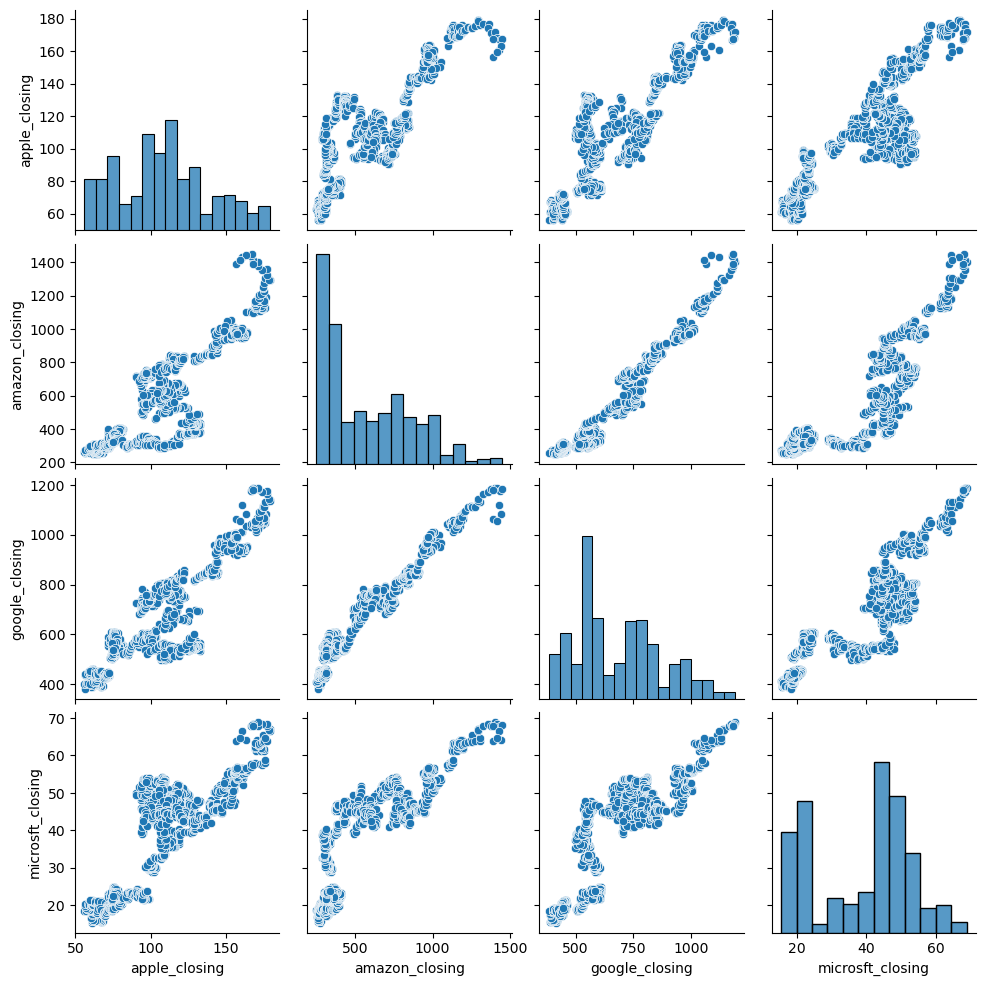

In [135]:
plt.figure(figsize=(6,3))
sns.pairplot(closing_price)

In [144]:
### to find corelation values 
closing_price.corr()

,apple_closing,amazon_closing,google_closing,microsft_closing
apple_closing,1.000000,0.819078,0.843736,0.863711
amazon_closing,0.819078,1.000000,0.973988,0.842778
google_closing,0.843736,0.973988,1.000000,0.849059
microsft_closing,0.863711,0.842778,0.849059,1.000000


<Axes: >

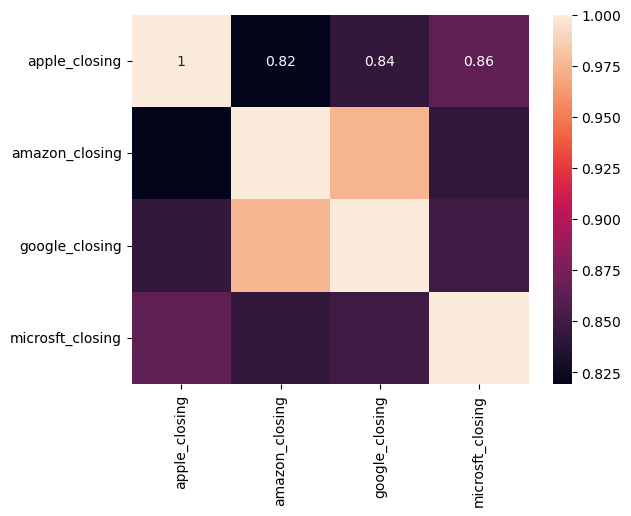

In [145]:
sns.heatmap(closing_price.corr(), annot=True)

In [148]:
wc= ' '.join(all_data['Name'].unique())

In [149]:
wc

'AAL AAPL AAP ABBV ABC ABT ACN ADBE ADI ADM ADP ADSK ADS AEE AEP AES AET AFL AGN AIG AIV AIZ AJG AKAM ALB ALGN ALK ALLE ALL ALXN AMAT AMD AME AMGN AMG AMP AMT AMZN ANDV ANSS ANTM AON AOS APA APC APD APH APTV ARE ARNC ATVI AVB AVGO AVY AWK AXP AYI AZO A BAC BAX BA BBT BBY BDX BEN BF.B BHF BHGE BIIB BK BLK BLL BMY BRK.B BSX BWA BXP CAG CAH CAT CA CBG CBOE CBS CB CCI CCL CDNS CELG CERN CFG CF CHD CHK CHRW CHTR CINF CI CLX CL CMA CMCSA CME CMG CMI CMS CNC CNP COF COG COL COO COP COST COTY CPB CRM CSCO CSRA CSX CTAS CTL CTSH CTXS CVS CVX CXO C DAL DE DFS DGX DG DHI DHR DISCA DISCK DISH DIS DLR DLTR DOV DPS DRE DRI DTE DUK DVA DVN DWDP DXC D EA EBAY ECL ED EFX EIX EL EMN EMR EOG EQIX EQR EQT ESRX ESS ES ETFC ETN ETR EVHC EW EXC EXPD EXPE EXR FAST FBHS FB FCX FDX FE FFIV FISV FIS FITB FLIR FLR FLS FL FMC FOXA FOX FRT FTI FTV F GD GE GGP GILD GIS GLW GM GOOGL GOOG GPC GPN GPS GRMN GS GT GWW HAL HAS HBAN HBI HCA HCN HCP HD HES HIG HII HLT HOG HOLX HON HPE HPQ HP HRB HRL HRS HSIC HST HSY HUM IBM

In [150]:
from wordcloud import STOPWORDS, WordCloud

In [151]:
x=WordCloud(stopwords=set(STOPWORDS)).generate(wc)

(-0.5, 399.5, 199.5, -0.5)

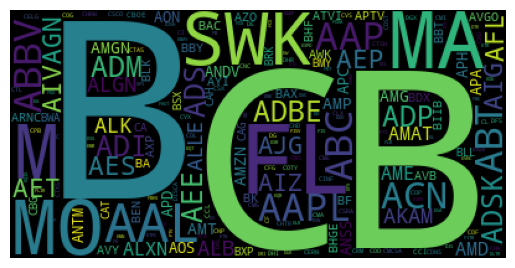

In [152]:
plt.imshow(x)
plt.axis('off')